# Preparação do ambiente

## Bibliotecas

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re
import unidecode

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from string import punctuation

from functions import plot_docs_matrix, plot_wordcloud

from sklearn.decomposition import TruncatedSVD

## Constantes e funções auxiliares

In [2]:
def tokenizer(doc):
    doc = doc.lower()
    doc = unidecode.unidecode(doc)
    
    patterns = [('wi\s?.?fi', 'wifi'), 
                ('2,4', '2.4'), 
                ('5,8', '5.8')]
    for pattern, repl in patterns:
        doc = re.sub(pattern, repl, doc)
    
    stop_words = stopwords.words('portuguese')
    stop_words.extend(stopwords.words('english'))
    stop_words.extend(list(punctuation))
    # stopwords específicas do domínio
    stop_words.extend(['cm', 'feature', 'features', 'informações', 'itens', 'leve', 'list', 'nulo', 'package', 'pacote', 'pacotes', 'recurso', 'tamanho', 'ver', 'unidades'])
    
    tokens = [token for token in word_tokenize(doc) if token not in stop_words]
    return tokens

# Carga e prepação dos dados

In [3]:
file_cat_sample = '../datasets/cat_to_label_sample.xlsx'
df_cat_sample = pd.read_excel(file_cat_sample)
df_cat_sample = df_cat_sample.iloc[:,-2:]
df_cat_sample = df_cat_sample.dropna()

C:\Users\maxwelfreitas\anaconda3\envs\certificacao\lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Data Validation extension is not supported and will be removed
  for idx, row in parser.parse():


# Análise

In [4]:
docs = df_cat_sample['Nome'].apply(lambda doc: ' '.join(tokenizer(doc))).to_numpy()

map_target_to_int = {target:i for i,target in enumerate(df_cat_sample.Target.unique())}
map_target_to_name = {i:target for i,target in enumerate(df_cat_sample.Target.unique())}

targets = df_cat_sample.Target.map(map_target_to_int).to_numpy()

Categoria: Antena


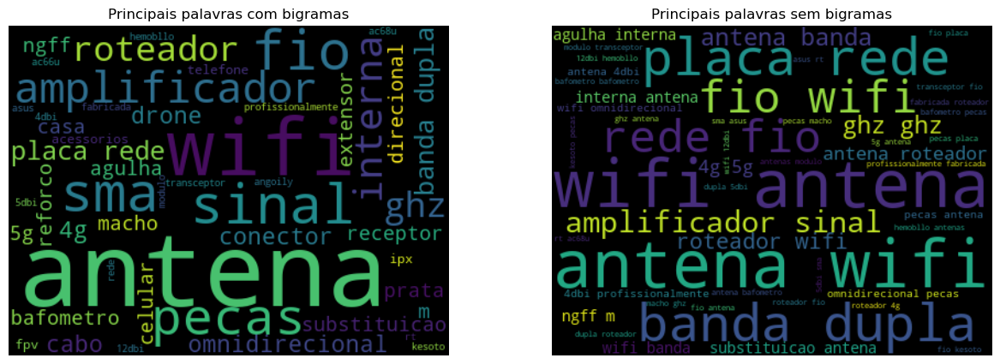

Categoria: Baterias (eletrônicos em geral)


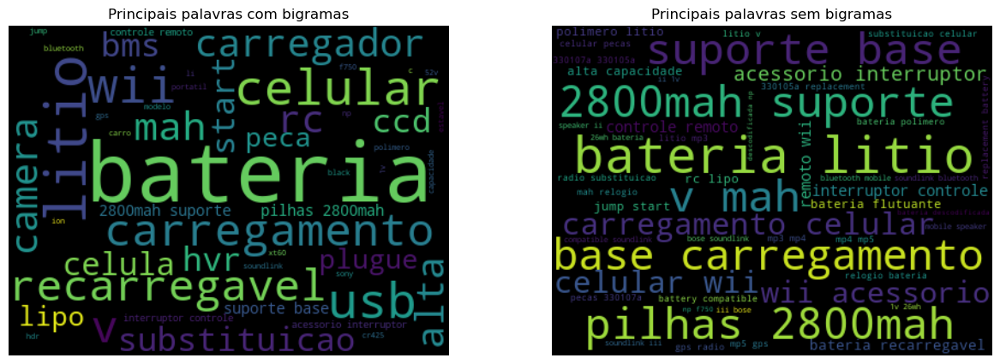

Categoria: Cabo (em geral)


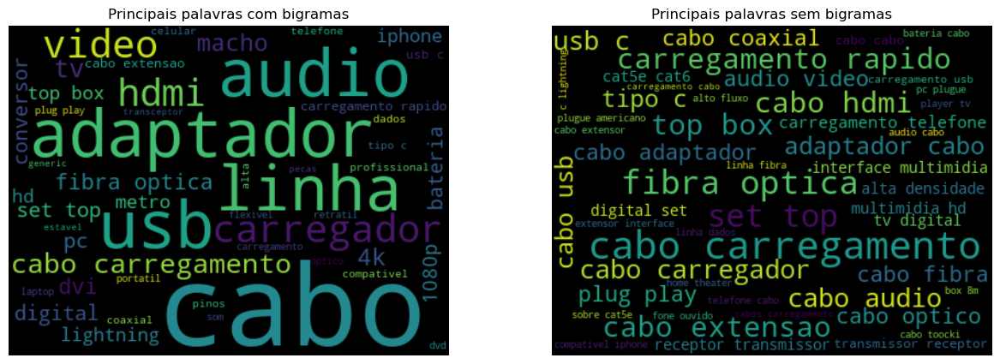

Categoria: Cabo de rede


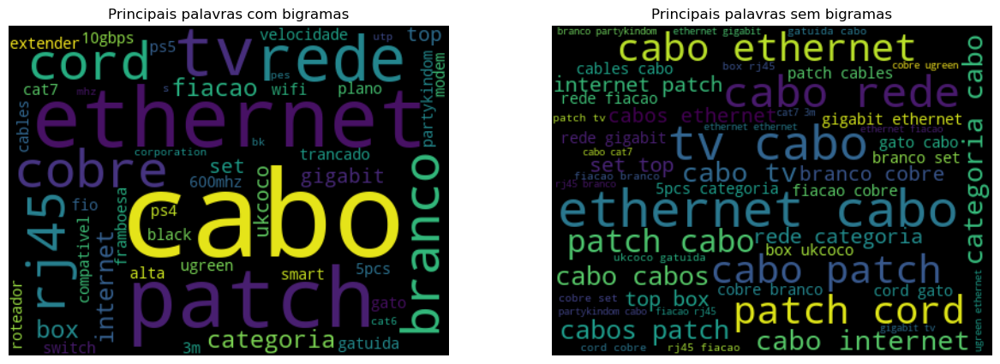

Categoria: Câmera sem fio


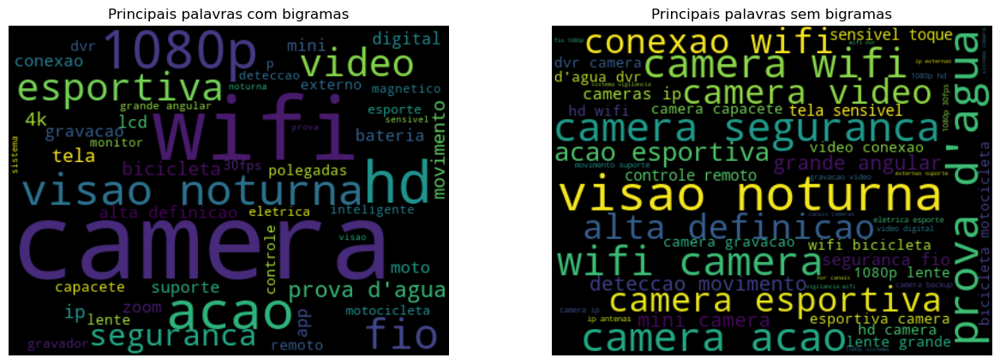

Categoria: Carregador de celular


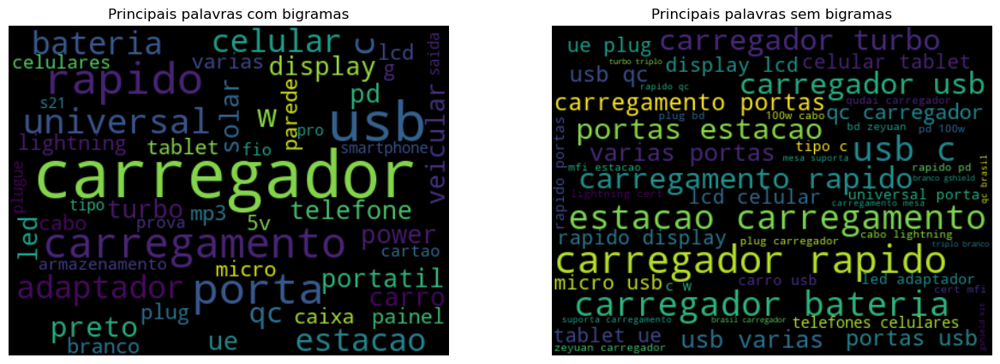

Categoria: Carregador portátil (powerbank)


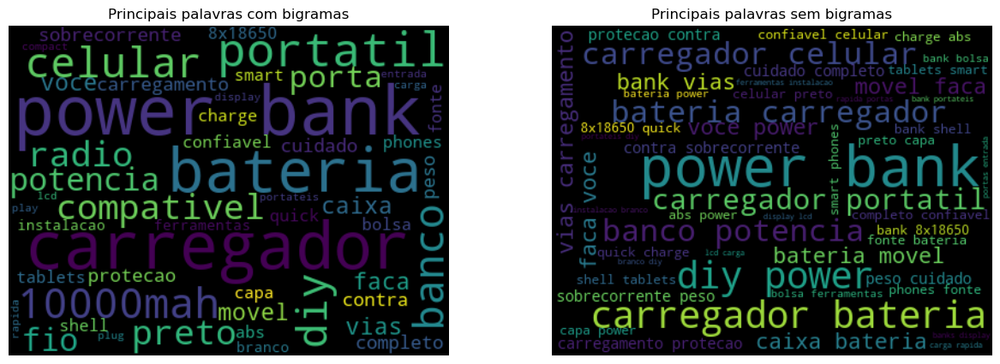

Categoria: Carregador sem fio


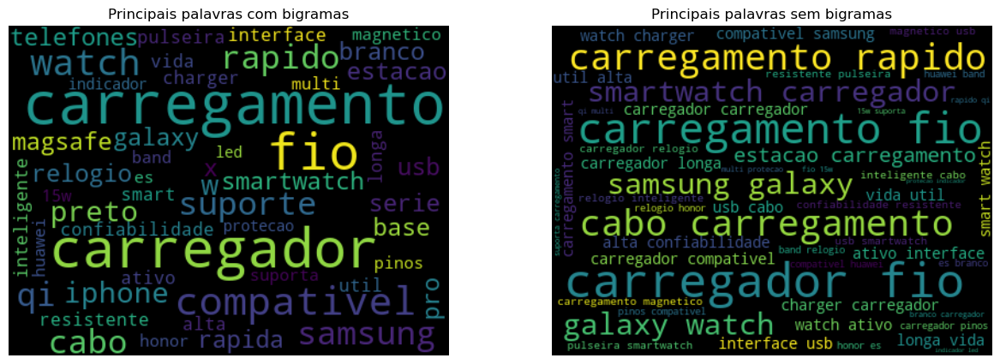

Categoria: Carregadores e fontes (eletrônicos em geral)


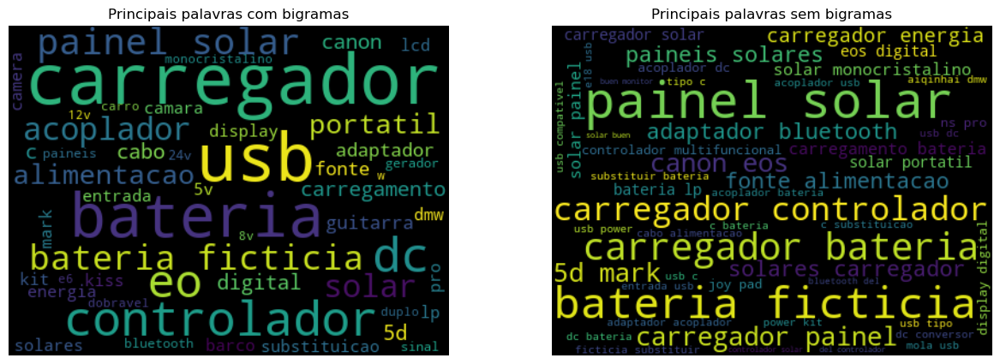

Categoria: Cartão de memória


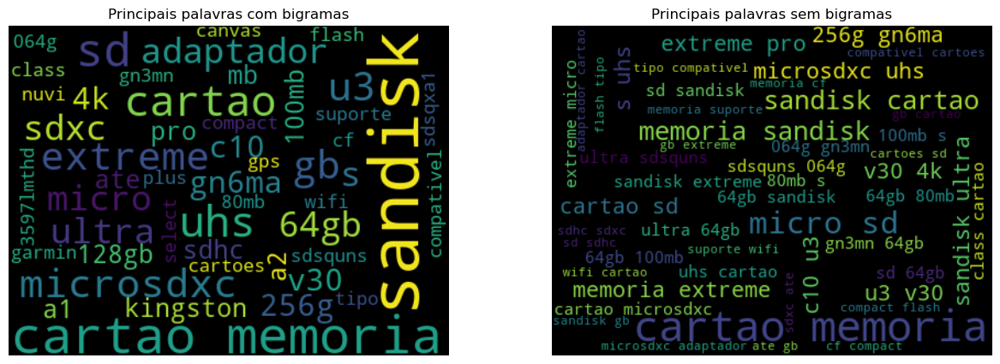

Categoria: Desktop/Notebook


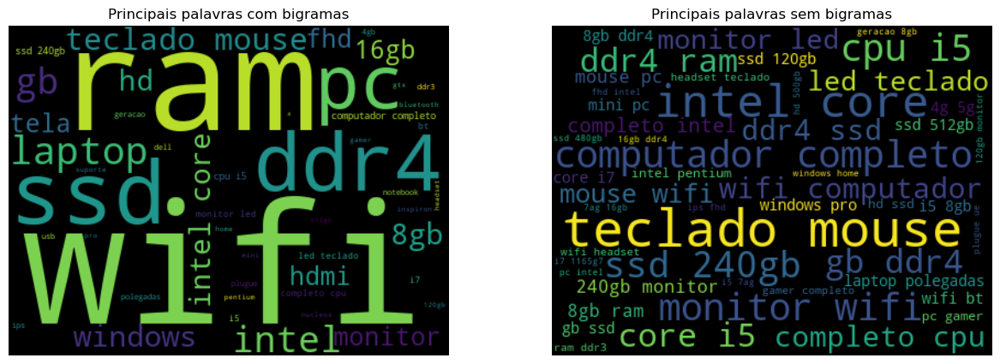

Categoria: Drone


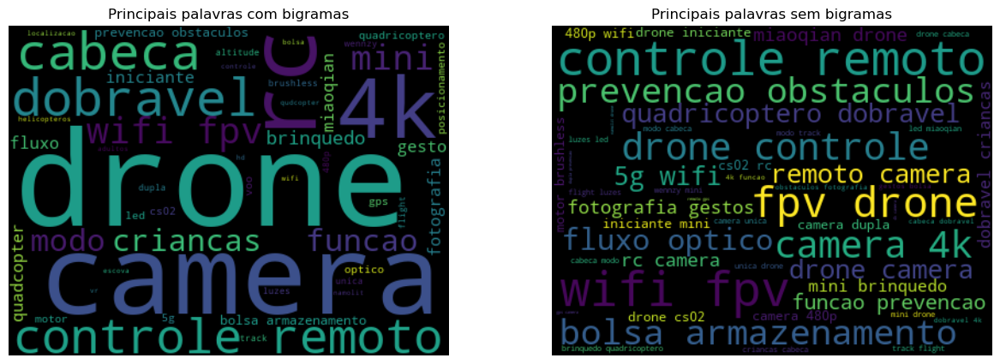

Categoria: Extensor de vídeo VGA/HDMI


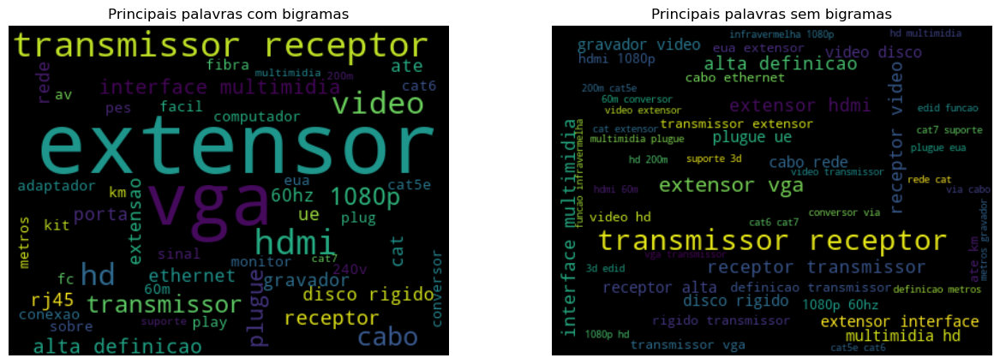

Categoria: Fone de ouvido sem fio


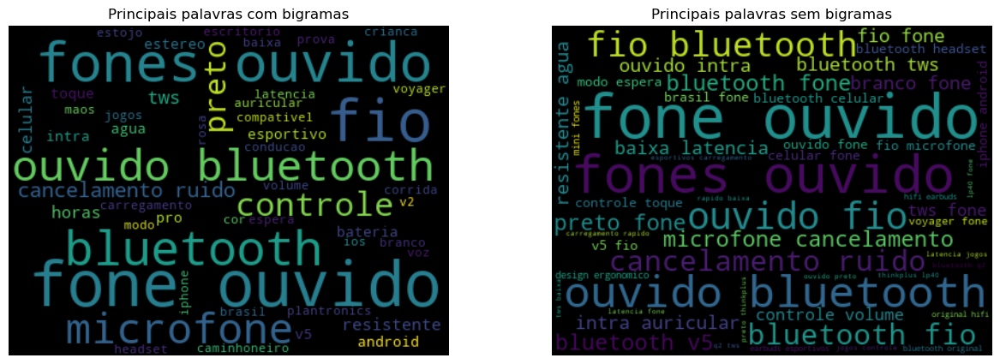

Categoria: Hub Switch


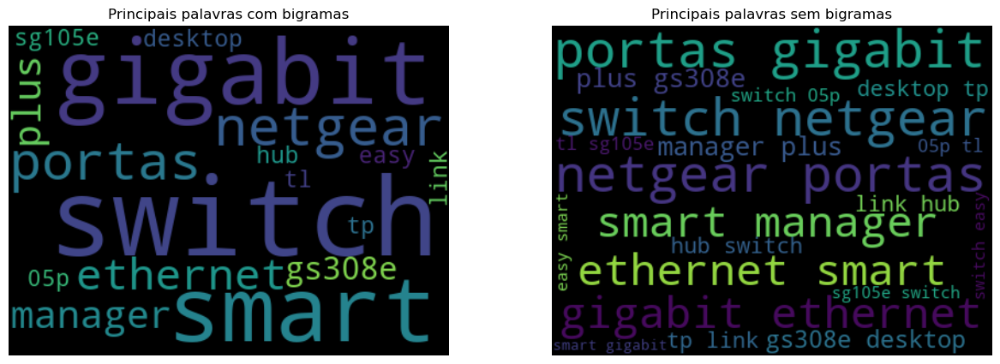

Categoria: Impressora e cartuchos


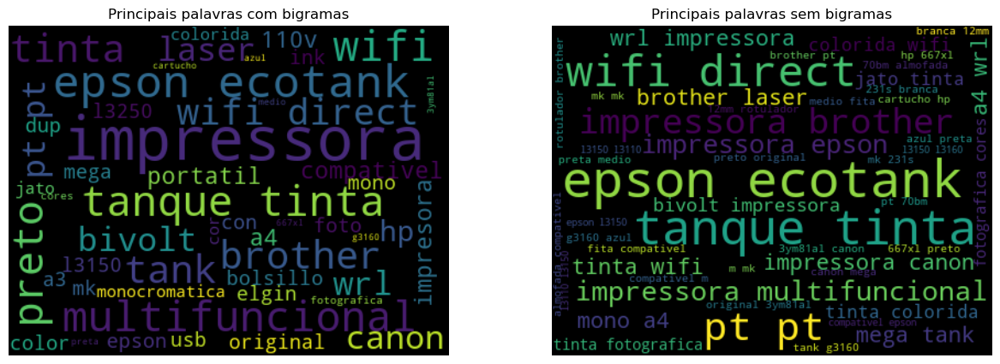

Categoria: Microfone sem fio


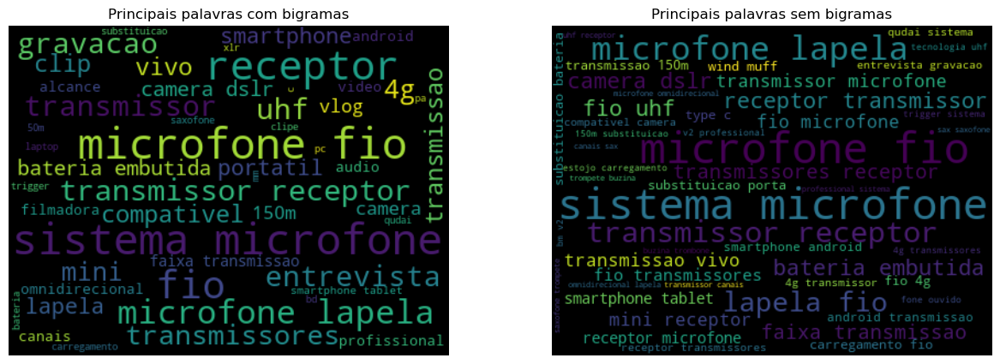

Categoria: Modem 3G/4G/WiFi


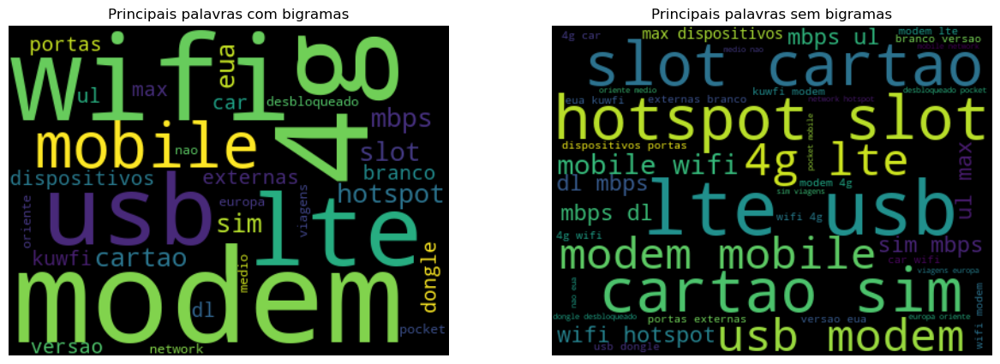

Categoria: Outros


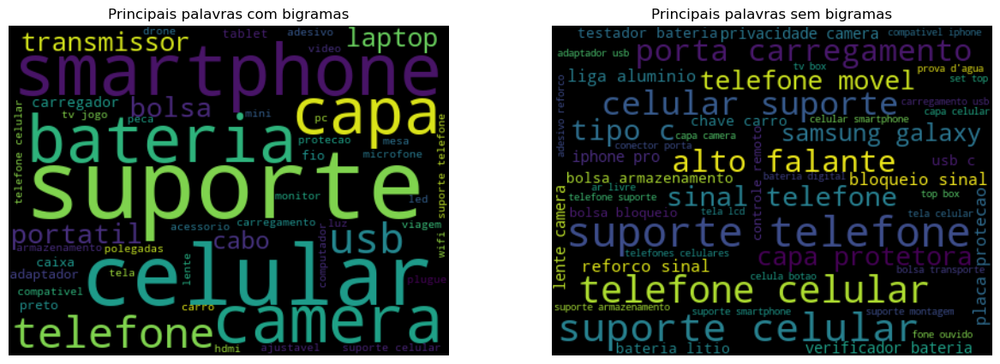

Categoria: Reforçador de sinal de celular


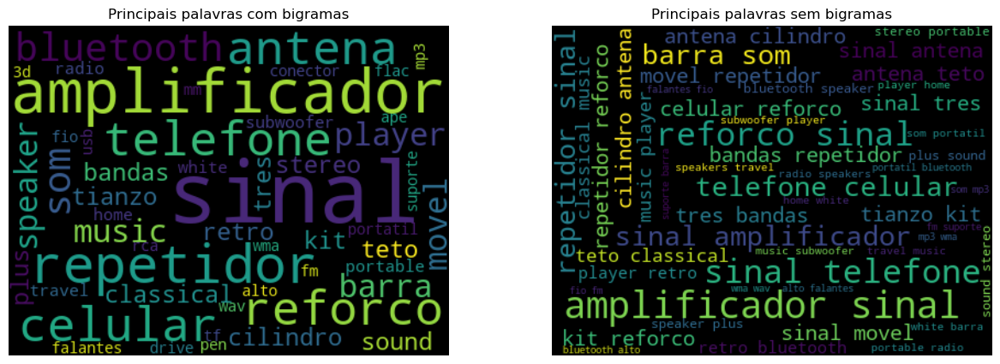

Categoria: Roteador/Reforçador WiFi


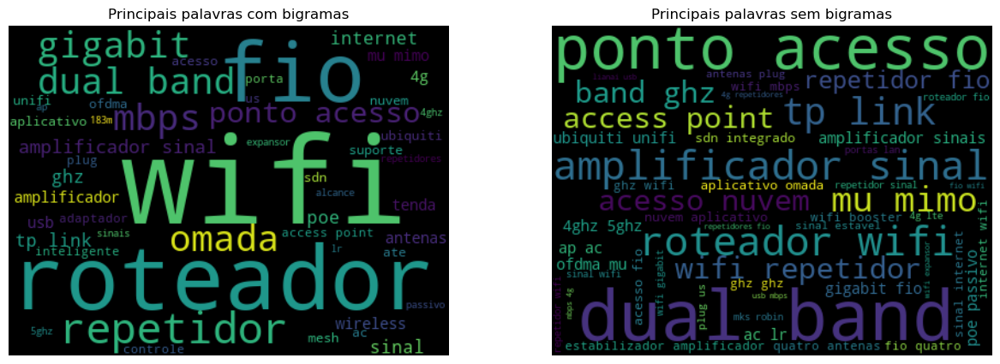

Categoria: Smart TV


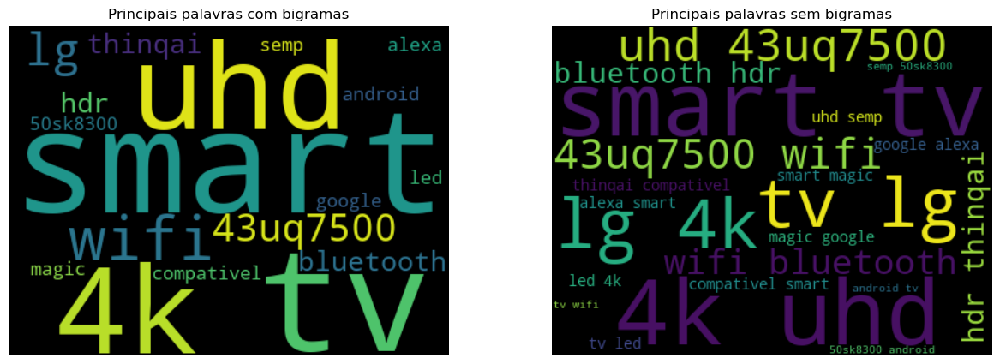

Categoria: Smartwatch


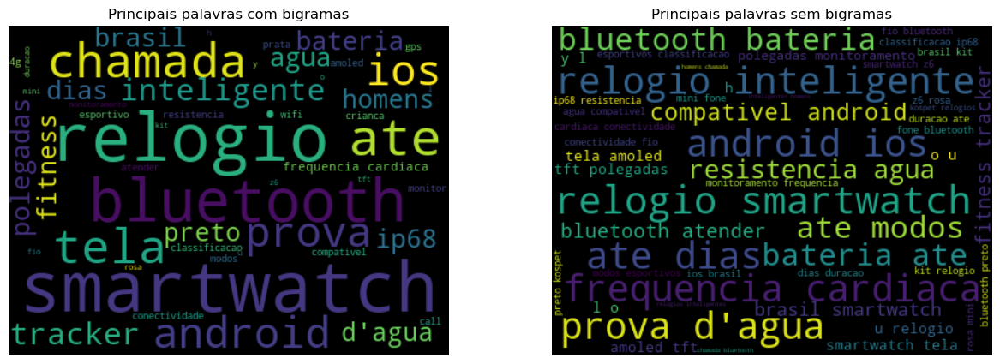

Categoria: Tablets


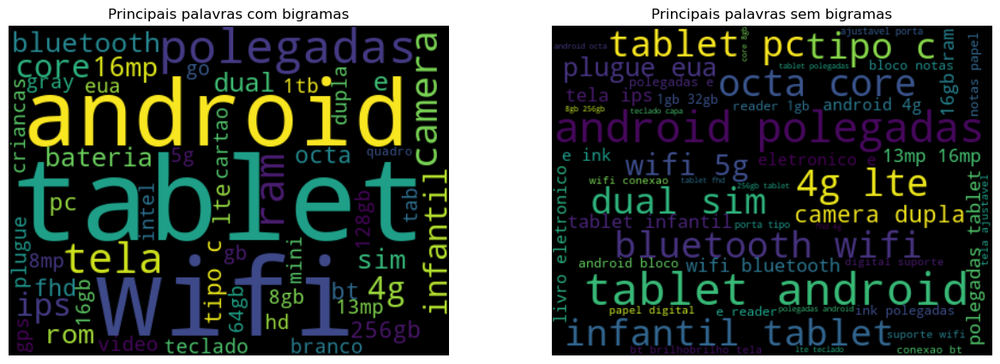

Categoria: Telefone celular


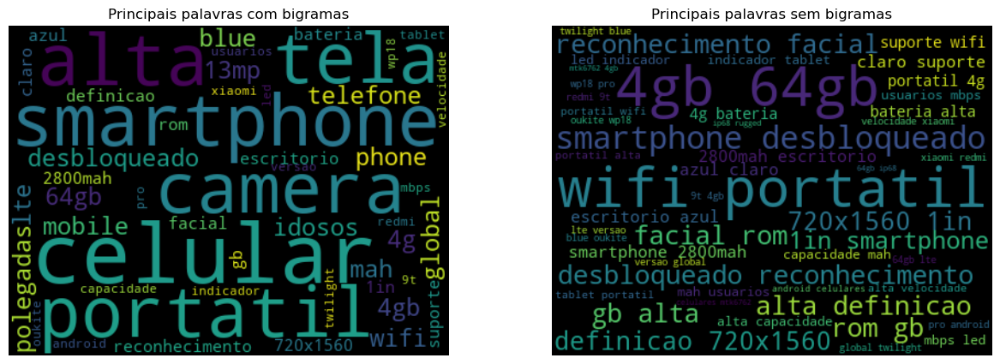

Categoria: Transceptor de Radiação Restrita


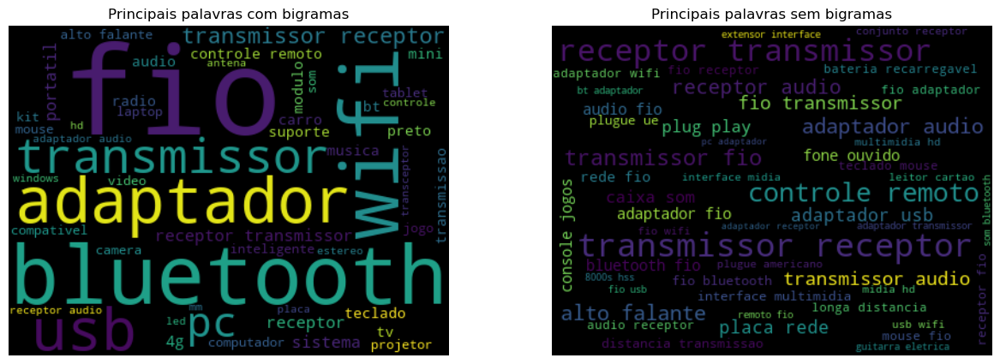

Categoria: Transceptor de RF (HF/VHF/UHF)


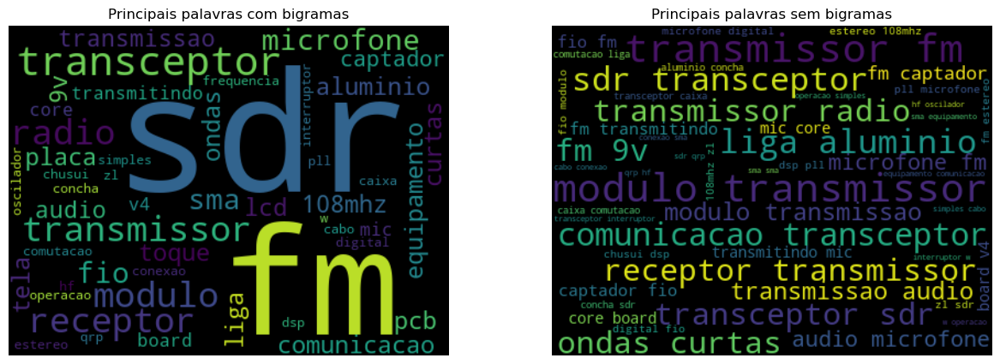

Categoria: Transceptor/Conversor SFP


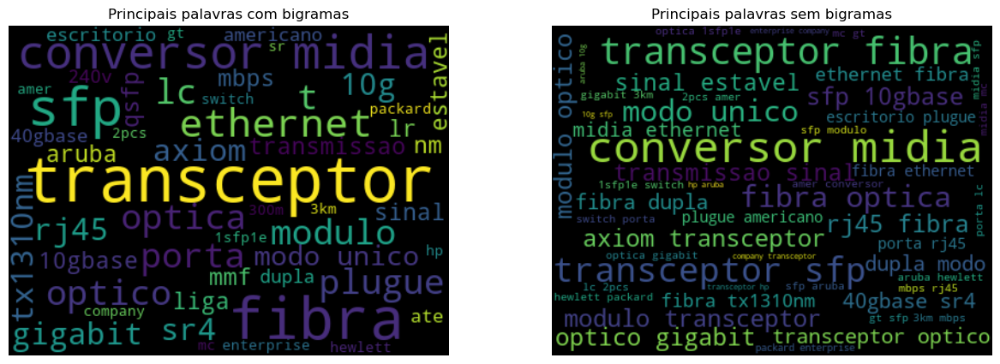

Categoria: TV Box


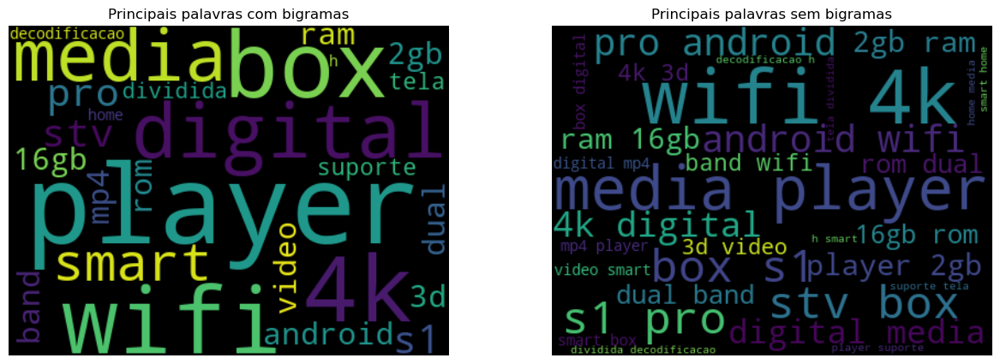

In [5]:
for target in np.unique(targets):
    print(f'Categoria: {map_target_to_name[target]}')
    ix = np.where(targets==target)
    plot_wordcloud(docs[ix])

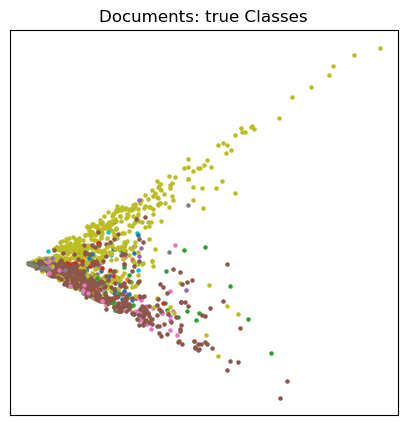

In [6]:
count_vect = CountVectorizer()
count_docs_matrix = count_vect.fit_transform(docs)
plot_docs_matrix(count_docs_matrix,targets)

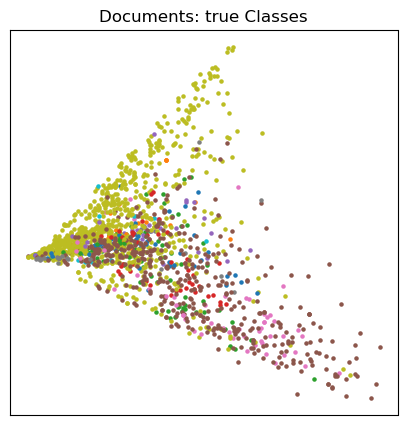

In [7]:
tf_vect = TfidfVectorizer(min_df=5,ngram_range=(1,2),use_idf=False)
tf_docs_matrix = tf_vect.fit_transform(docs)
plot_docs_matrix(tf_docs_matrix,targets)

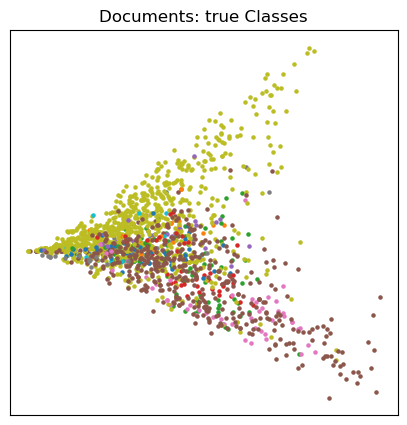

In [8]:
tfidf_vect = TfidfVectorizer(min_df=5,ngram_range=(1,2),use_idf=True)
tfidf_docs_matrix = tfidf_vect.fit_transform(docs)
plot_docs_matrix(tfidf_docs_matrix,targets)

In [9]:
# for target in np.unique(targets):
#     # print(f'Categoria: {map_target_to_name[target]}')
#     ix = np.where(targets==target)
#     plot_docs_matrix(tf_docs_matrix[ix],title=map_target_to_name[target])

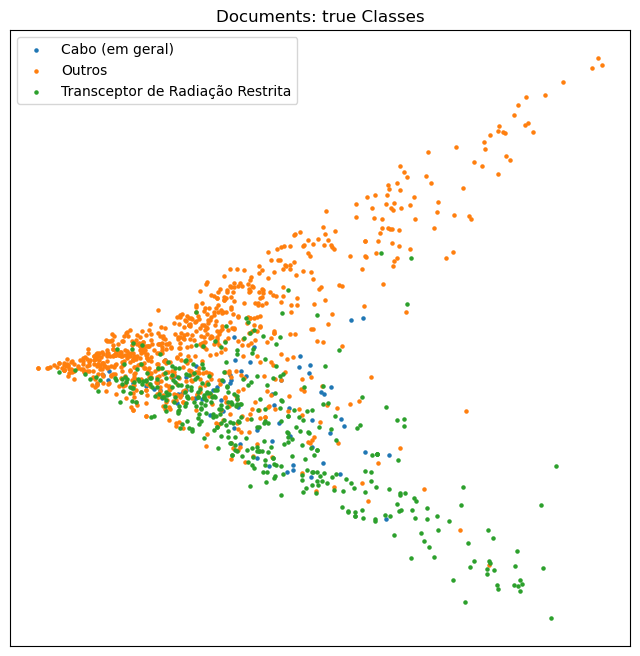

In [10]:

unique_targets, unique_targets_count = np.unique(targets,return_counts=True)
top_targets = np.where(unique_targets_count>50)[0]
top_targets_ix = np.isin(targets,top_targets)
ix=np.where(top_targets_ix==True)

true_targets = targets[ix]

pca = TruncatedSVD(n_components=2)
pca_matrix = pca.fit_transform(tfidf_docs_matrix[ix])
scatter_x = pca_matrix[:, 0] # first principle component
scatter_y = pca_matrix[:, 1] # second principle component

fig,ax = plt.subplots(figsize=(8,8))

for group in np.unique(true_targets):
    group_label = map_target_to_name[group]
    # if group_label == 'Outros':
    #     continue
    ix = np.where(true_targets == group)
    ax.scatter(scatter_x[ix], scatter_y[ix], label=group_label, s=5)
    ax.set_title('Documents: true Classes')   

ax.set_xticks([])
ax.set_yticks([])

plt.legend()    
plt.show()

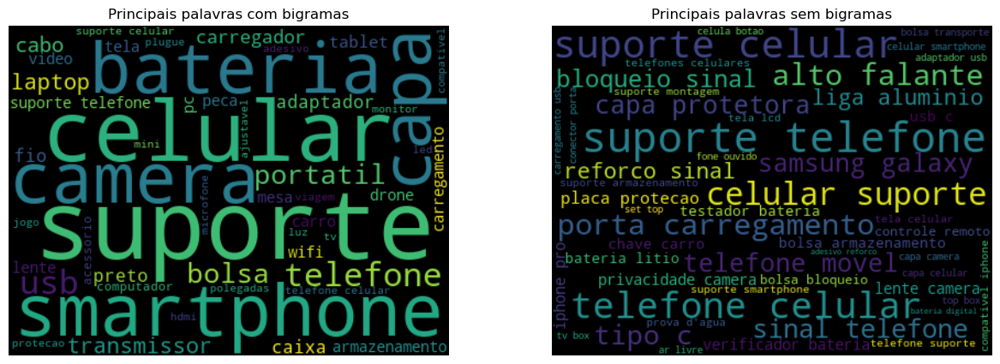

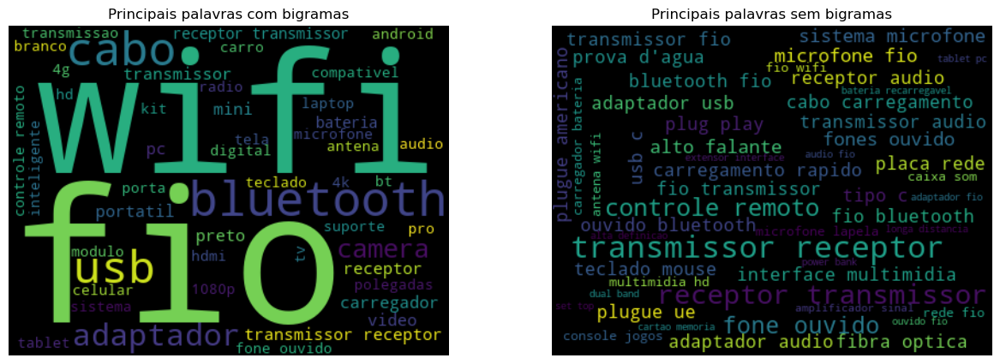

In [12]:
ix_outros = np.where(targets==18)
ix_not_outros = np.where(targets!=18)

plot_wordcloud(docs[ix_outros])
plot_wordcloud(docs[ix_not_outros])